Init and load data.

In [ ]:
!pip install gcsfs

In [9]:
!pip install --upgrade google-cloud-bigquery

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 216 kB 5.3 MB/s eta 0:00:01


In [1]:
%matplotlib inline
import sys,os
util_path = os.path.abspath(os.path.join(os.path.pardir, 'lib'))
if util_path not in sys.path and os.path.exists(util_path):
    sys.path.insert(0, util_path)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import argparse, logging, json
import datetime as dt
from datetime import timedelta

import itertools
from collections import OrderedDict

import math
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, precision_score, f1_score, recall_score, average_precision_score, precision_recall_curve, classification_report, accuracy_score


from lib.io import IO
from lib.bqhandler import BQHandler
from lib import config

pd.set_option('display.width', 1000)

import seaborn as sns
sns.set()
sns.set(style="whitegrid", palette="muted")

In [2]:
def log_class_dist(data, labels=None):
    """
    Log class distributions
    """
    classes = []
    for i in labels:
        classes.append(sum(data == i))

    c_all = len(data)

    logging.info('Class sizes:')
    i = 0
    for c in classes:
        print(' {}: {} ({:.02f})%'.format(i, c, c/c_all*100))
        i += 1

In [3]:
def pred(config_name, verbose=False):
    """
    Load configuration, model and predict
    """
    print('\nPredicting continuous test set with configuration {}...'.format(config_name))
    
    class Options():
        pass
    options = Options() 
    options.starttime = '2010-01-01'
    options.endtime = '2012-01-10'
    options.config_filename = 'cnf/classifiers.ini'
    options.config_name = config_name
    options.stations = None #'HKI,KE,KV,HPL,TKL,RI'.split(',')

    config.read(options)
    
    starttime, endtime = io.get_dates(options)

    # Get params
    all_param_names = options.label_params + options.classifier_feature_params + options.meta_params
    aggs = io.get_aggs_from_param_names(options.feature_params)
    
    if verbose:
        print('Loading data...')
    all_data = bq.get_rows(starttime,
                           endtime,
                           loc_col='trainstation',
                           project=options.project,
                           dataset='trains_data',
                           table='features_testset_v4',
                           parameters=all_param_names,
                           locations=options.stations,
                           reason_code_table='reason_codes',
                           reason_codes_exclude=options.reason_codes_exclude,
                           reason_codes_include=options.reason_codes_include
                          )
    if verbose:
        print('Filtering data...')
        
    all_data = io.filter_train_type(labels_df=all_data,
                                    train_types=['K','L'],
                                    sum_types=True,
                                    train_type_column='train_type',
                                    location_column='trainstation',
                                    time_column='time',
                                    sum_columns=['delay'],
                                    aggs=aggs)

    all_data = io.calc_delay_avg(all_data)
    
    all_data.sort_values(by=['time', 'trainstation'], inplace=True)
    all_data.set_index('time', inplace=True)
    if verbose:
        print('Data contain {} rows...'.format(len(all_data)))    
    
    all_data['class'] = all_data['delay'].map(lambda x: 1 if x > options.delay_limit else 0)
    all_data = all_data.assign(month=lambda df: df.index.map(lambda x: x.month)) 
    if 'month' not in options.classifier_feature_params:
        options.classifier_feature_params.append('month')
    
    #log_class_dist(all_data['class'], [0, 1])
    
    if options.normalize_classifier:
        normalizer = io.load_scikit_model(options.save_path+'/xscaler_classifier.pkl')
        
    y_pred_proba = None
    y = []

    if options.station_specific_classifier:
        for loc in options.stations:
            fname = options.save_path+'/{}/classifier.pkl'.format(loc)
            if verbose:
                print('Loading model for station {} from {}...'.format(loc, fname))
            try:
                model = io.load_scikit_model(fname)
            except:
                print('WARNING. {} not found'.format(fname))
                continue

            if options.normalize_classifier:
                if verbose:
                    print('Normalizing...')
                X = normalizer.transform(all_data.loc[(all_data['trainstation'] == loc), options.classifier_feature_params])
            else:
                X = all_data.loc[(all_data['trainstation'] == loc), options.classifier_feature_params]
                
            if verbose:
                print('Predicting {} rows...'.format(len(X)))
            y_pred_proba_ = model.predict_proba(X)
            if y_pred_proba is None:
                y_pred_proba = y_pred_proba_
            else:
                y_pred_proba = np.append(y_pred_proba, y_pred_proba_, axis=0)
            y += list(all_data.loc[(all_data['trainstation'] == loc), 'class'].values.ravel())
    else:
        fname = options.save_path+'/all/classifier.pkl'
        if verbose:
            print('Loading model from {}...'.format(fname))
        model = io.load_scikit_model(fname)

        if options.normalize_classifier:
            X = normalizer.transform(all_data.loc[:, options.classifier_feature_params])
        else:
            X = all_data.loc[:, options.classifier_feature_params]
            
        y_pred_proba = model.predict_proba(X)
        y = all_data.loc[:, 'class'].values.ravel()
    
    y_pred = np.argmax(y_pred_proba, axis=1)
    print("Classification performance for {}: \n{}".format(config_name, classification_report(y, y_pred)))
    print('Precision: {:.2f}'.format(precision_score(y, y_pred, average='macro')))
    print('Recall: {:.2f}'.format(recall_score(y, y_pred, average='macro')))
    print('F1 score: {:.2f}'.format(f1_score(y, y_pred, average='macro')))
        
    return y, y_pred_proba

In [4]:
def pred_validation(config_name, verbose=False):
    """
    Load configuration, model and predict
    """
    print('\nPredicting random test set with configuration {}...'.format(config_name))
    
    class Options():
        pass
    options = Options() 
    options.starttime = '2010-01-01'
    options.endtime = '2015-01-10'
    options.config_filename = 'cnf/classifiers.ini'
    options.config_name = config_name
    options.stations = None #'HKI,KE,KV,HPL,TKL,RI'.split(',')

    config.read(options)
    
    # Get params
    if 'month' not in options.classifier_feature_params:
        options.classifier_feature_params.append('month')

    all_param_names = options.label_params + options.classifier_feature_params + options.meta_params
    aggs = io.get_aggs_from_param_names(options.feature_params)
    
    if verbose:
        print('Loading data...')
    tname = options.model+'_'+options.feature_dataset+'_'+options.config_name+'_test'
    tname = tname.replace('-','_')
        
    all_data = bq.table_to_dataset(dataset='trains_data',
                                   table=tname)
    
    #log_class_dist(all_data['class'], [0, 1])
    
    if options.normalize_classifier:
        normalizer = io.load_scikit_model(options.save_path+'/xscaler_classifier.pkl')
        
    y_pred_proba = None
    y = []
    
    if options.station_specific_classifier:
        for loc in options.stations:
            fname = options.save_path+'/{}/classifier.pkl'.format(loc)
            if verbose:
                print('Loading model for station {} from {}...'.format(loc, fname))
                
            try:    
                model = io.load_scikit_model(fname)
            except:
                print('WARNING. {} not found'.format(fname))
                continue

            if options.normalize_classifier:
                if verbose: print('Normalizing...')
                X = normalizer.transform(all_data.loc[(all_data['trainstation'] == loc), options.classifier_feature_params])
            else:
                X = all_data.loc[(all_data['trainstation'] == loc), options.classifier_feature_params]
              
            if verbose:
                print('Predicting {} rows...'.format(len(X)))
            y_pred_proba_ = model.predict_proba(X)
            if y_pred_proba is None:
                y_pred_proba = y_pred_proba_
            else:
                y_pred_proba = np.append(y_pred_proba, y_pred_proba_, axis=0)
            y += list(all_data.loc[(all_data['trainstation'] == loc), 'class'].values.ravel())
    else:
        fname = options.save_path+'/all/classifier.pkl'
        if verbose:
            print('Loading model from {}...'.format(fname))
        model = io.load_scikit_model(fname)

        if options.normalize_classifier:
            X = normalizer.transform(all_data.loc[:, options.classifier_feature_params])
        else:
            X = all_data.loc[:, options.classifier_feature_params]
            
        y_pred_proba = model.predict_proba(X)
        y = all_data.loc[:, 'class'].values.ravel()

    y_pred = np.argmax(y_pred_proba, axis=1)
    
    print("Classification performance for {}: \n{}".format(config_name, classification_report(y, y_pred)))
    print('Precision: {:.2f}'.format(precision_score(y, y_pred, average='macro')))
    print('Recall: {:.2f}'.format(recall_score(y, y_pred, average='macro')))
    print('F1 score: {:.2f}'.format(f1_score(y, y_pred, average='macro')))
        
    return y, y_pred_proba

In [5]:
def prec_rec_curve(y, y_pred, fontsize=40):
    """
    Precision - Recall Curve
    """

    plt.figure(figsize=(12, 12))

    plt.rc('font', size=fontsize)

    y = label_binarize(y, classes=[0,1])

    precision, recall, _ = precision_recall_curve(y, y_pred[:, 1])
    average_precision = average_precision_score(y, y_pred[:, 1])

    f_scores = np.linspace(0.2, 0.8, num=4)
    lines = []
    labels = []
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y_ = f_score * x / (2 * x - f_score)
        l, = plt.plot(x[y_ >= 0], y_[y_ >= 0], color='gray', alpha=0.5)
        plt.annotate('F1={0:0.1f}'.format(f_score), xy=(0.9, y_[45] + 0.02)) #, fontsize=10)

    lines.append(l)
    labels.append('F1 curves')

    l, = plt.plot(recall, precision, color='gold', lw=2)
    lines.append(l)
    labels.append('Micro-average (area = {0:0.2f})'
    ''.format(average_precision))

    fig = plt.gcf()
    fig.subplots_adjust(bottom=0.25)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xticks(np.arange(.2, 1., .2))
    plt.xlabel('Recall', labelpad=20)
    plt.ylabel('Precision', labelpad=20)
    plt.title('Precision-Recall Curve', pad=20)
    plt.legend(lines, labels, ncol=2)

In [7]:
class Options():
    pass
options = Options() 
options.starttime = '2010-01-01'
options.endtime = '2015-01-10'
options.config_filename = 'cnf/classifiers.ini'
options.config_name = 'bayes-all-codes'
options.stations = None #'HKI,KE,KV,HPL,TKL,RI'.split(',')

config.read(options)


bq = BQHandler()
io = IO(gs_bucket=options.gs_bucket)


In [9]:
configurations = [    
    ('bayes-weather-codes', 'GNB weather-related'), 
    ('bayes-all-codes', 'GNB complete'),
    ('rfc-weather-codes', 'RFC weather-related'),
    ('rfc-all-codes', 'RFC complete'),
    ('gbdt-weather-codes', 'GBC weather-related'),
    ('gbdt-all-codes-cv', 'GBC complete')
]

preds = []
for c, label in configurations:
    p = {}
    p['label'] = label
    p['pred'] = pred(c, True)
    p['pred_val'] = pred_validation(c), True
    preds.append(p)    
    print('\n ---------------------\n')


Predicting continuous test set with configuration bayes-weather-codes...
Loading data...
Filtering data...
Data contain 448 rows...
Loading model from models/dual/trains_data/bayes-weather-codes/all/classifier.pkl...
Classification performance for bayes-weather-codes: 
              precision    recall  f1-score   support

           0       0.70      0.95      0.80       308
           1       0.47      0.10      0.16       140

    accuracy                           0.68       448
   macro avg       0.58      0.52      0.48       448
weighted avg       0.63      0.68      0.60       448

Precision: 0.58
Recall: 0.52
F1 score: 0.48

Predicting random test set with configuration bayes-weather-codes...
Classification performance for bayes-weather-codes: 
              precision    recall  f1-score   support

           0       0.74      0.83      0.78       461
           1       0.53      0.40      0.45       227

    accuracy                           0.68       688
   macro avg     

In [158]:
def plot_roc(preds, fontsize=30, title = 'ROC curve', dpi=70):
    """
    Plot binary ROC
    """
    plt.clf()
    
    plt.rc('font', size=fontsize)
    fig, ax = plt.subplots(figsize=(12,12), dpi=dpi)

    colors = ['xkcd:olive green', 'xkcd:light blue', 'xkcd:mustard', 'xkcd:blood', 'xkcd:coral', 'xkcd:very dark purple']
    i = 0
    for p in preds:
        c = colors[i]
        y, y_pred = p['pred']
        fpr, tpr, threshhold = roc_curve(y, y_pred[:,1])
        roc_auc = auc(fpr, tpr)        
        plt.plot(fpr, tpr, color=c, lw=2, label="Continuous test set (AUC: {:0.2f})".format(roc_auc))
        
        values, what = p['pred_val']
        y, y_pred = values

        y = np.array(y)[~np.isnan(y_pred).any(axis=1)]
        y_pred = y_pred[~np.isnan(y_pred).any(axis=1)]

        fpr, tpr, threshhold = roc_curve(y, y_pred[:,1])
        roc_auc = auc(fpr, tpr)
        
        plt.plot(fpr, tpr, color=c, lw=2, linestyle='dashed', label="Random test set (AUC: {:0.2f})".format(roc_auc))
        i+=1

    plt.plot([0, 1], [0, 1], 'k--')
    
    plt.xlabel('False positive rate', fontsize=fontsize)
    plt.ylabel('True positive rate', fontsize=fontsize)

    ax.tick_params(axis = 'x', which = 'both', labelsize = 3/4*fontsize)
    ax.tick_params(axis = 'y', which = 'major', labelsize = 3/4*fontsize)

    plt.title(title, fontsize=fontsize)
    plt.legend(fontsize=fontsize, loc='upper center', bbox_to_anchor=(0.5, -0.1), frameon=False, ncol=2)

<Figure size 432x288 with 0 Axes>

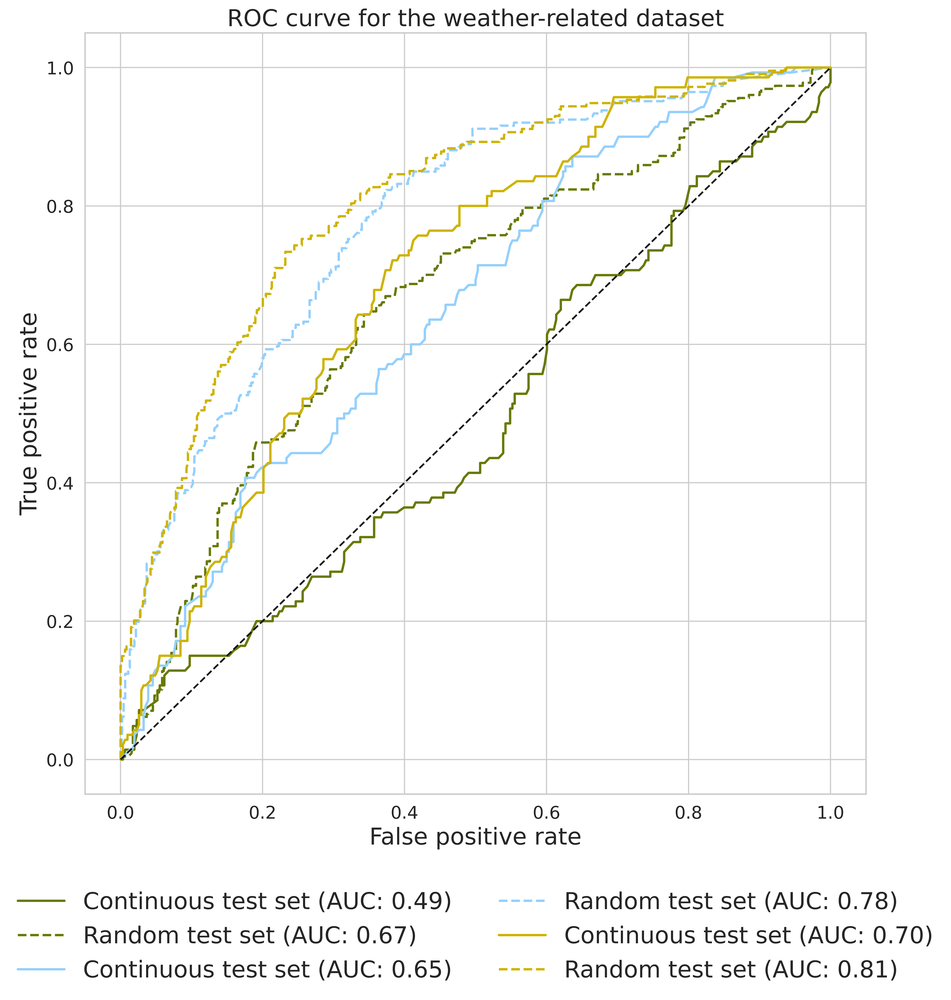

In [159]:
preds_weather, preds_complete = [], []
for c in preds:
    if 'weather' in c['label']:
        preds_weather.append(c)
    else:
        c['label'] = c['label'].replace('complete','whole')
        preds_complete.append(c)

plot_roc(preds_weather, 20, 'ROC curve for the weather-related dataset', dpi=600)

<Figure size 432x288 with 0 Axes>

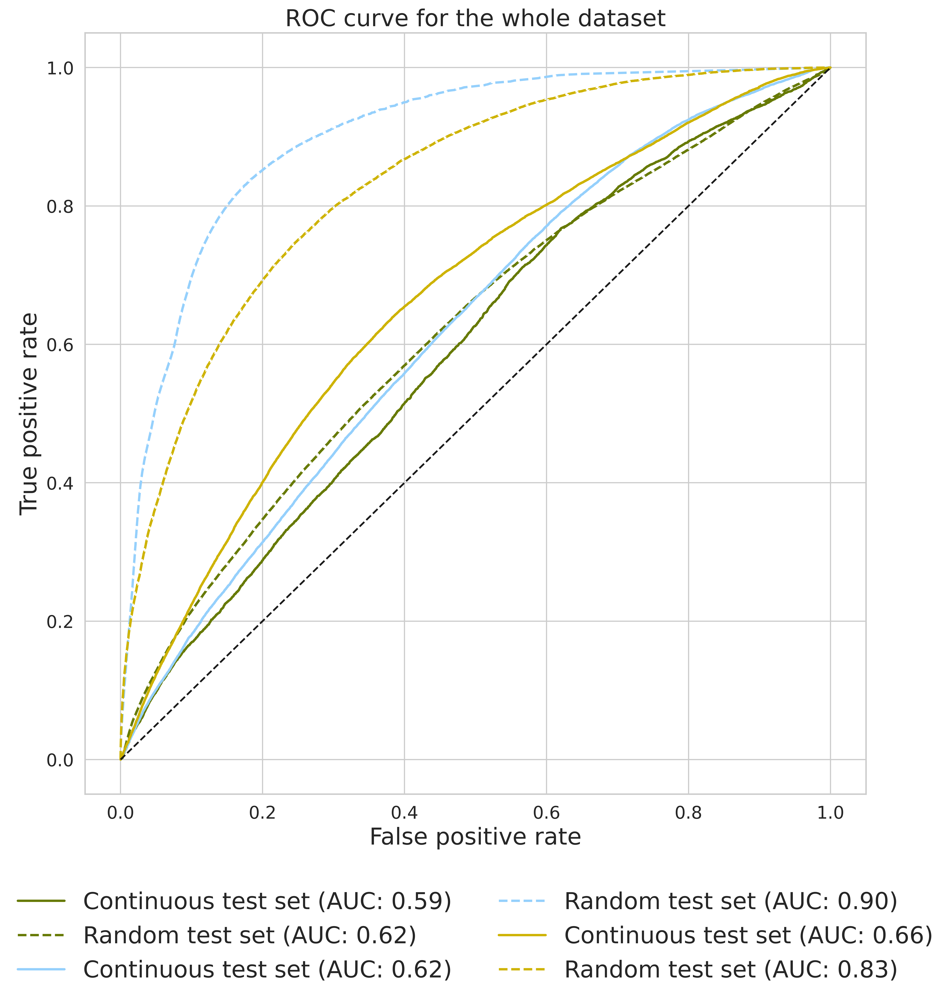

In [160]:
plot_roc(preds_complete, 20, 'ROC curve for the whole dataset', dpi=600)

<Figure size 432x288 with 0 Axes>

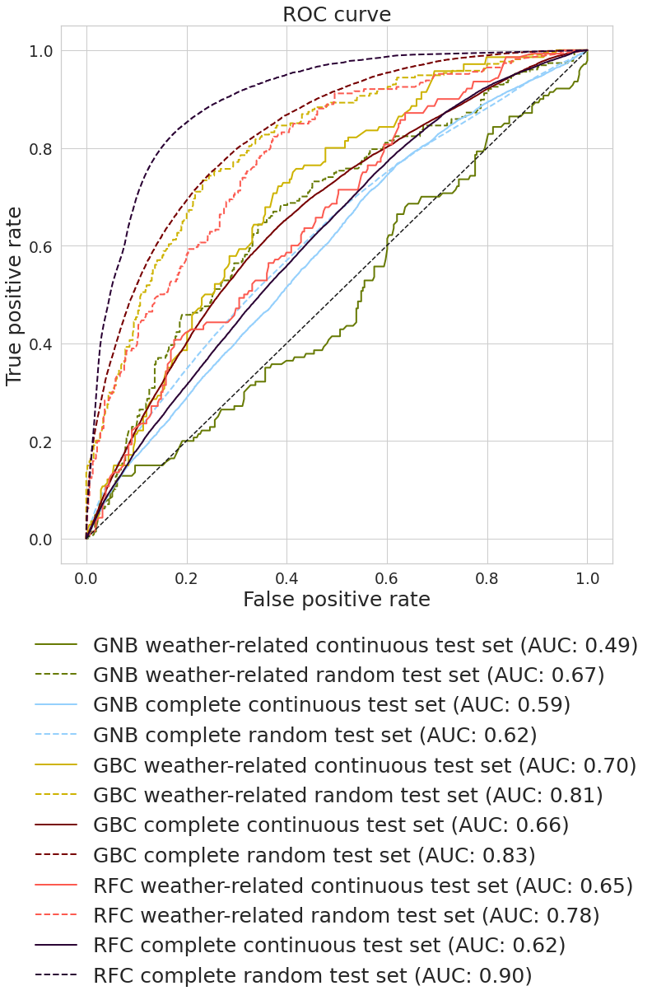

In [12]:
plot_roc(preds, 25)

In [25]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title='',
                          cmap=plt.cm.Greys,
                          fontsize=40,
                          ax=None,
                          dpi=70):
    """
    This function logging.debugs and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    y_pred = np.argmax(y_pred, axis=1)

    #plt.clf()
    #plt.rc('font', size=fontsize)

    #fig, ax = plt.subplots(figsize=(12,12))
    np.set_printoptions(precision=2)
    cm = confusion_matrix(y_true, y_pred)
    #if normalize:
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm_norm, interpolation='nearest', cmap=cmap)
    tick_marks = np.arange(len(classes))
    
    #ax.xaxis.tick_top()
    
    plt.xticks(tick_marks, classes) #, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = .4 #cm.max() / 2.
    for i, j in itertools.product(range(cm_norm.shape[0]), range(cm_norm.shape[1])):        
        t = '{cm_norm:.2f}'.format(cm_norm=cm_norm[i, j])
        plt.text(j, i, t, #format(cm[i, j], fmt)
                 horizontalalignment="center",
                 color="white" if cm_norm[i, j] > thresh else "black")
        
        t = '({cm:d})'.format(cm=cm[i, j])
        plt.text(j, i+.2, t, #format(cm[i, j], fmt)
                 horizontalalignment="center",
                 color="white" if cm_norm[i, j] > thresh else "black", fontsize=fontsize*3/4)



    plt.tick_params(axis = 'x', which = 'both', labelsize = 3/4*fontsize)
    plt.tick_params(axis = 'y', which = 'major', labelsize = 3/4*fontsize)
        
    #fig.subplots_adjust(bottom=0.12)
    plt.ylabel('True label', fontsize=fontsize)
    plt.xlabel('Predicted label', fontsize=fontsize)
    plt.grid(False)
    plt.title(title, fontsize=fontsize)
    #plt.tight_layout()

In [32]:
def plot_confusions(preds, fontsize=30, dpi=70):
    plt.rc('font', size=fontsize)
    ncols = 3
    nrows = math.ceil(len(preds)/ncols)*2
    plt.subplots(figsize=(20,20/ncols*nrows), dpi=dpi)
    i=0
    for p in preds:
        ax = plt.subplot(nrows, ncols, i+1)
        plot_confusion_matrix(preds[i]['pred'][0], 
                              preds[i]['pred'][1], 
                              range(2), True, 
                              preds[i]['label'] + '\n continuous test set', 
                              fontsize=fontsize, ax=ax)
        i += 1

    j=0
    for p in preds:
        ax = plt.subplot(nrows, ncols, i+1)         
        plot_confusion_matrix(preds[j]['pred_val'][0][0], 
                              preds[j]['pred_val'][0][1], 
                              range(2), True, 
                              preds[j]['label'] + '\n random test set', 
                              fontsize=fontsize, ax=ax)
        i += 1
        j += 1

    plt.tight_layout()

In [19]:
len(preds)

6

In [20]:
preds_orig = preds
po = [preds[0], preds[1], preds[4], preds[5], preds[2], preds[3]] 

In [21]:
preds = po

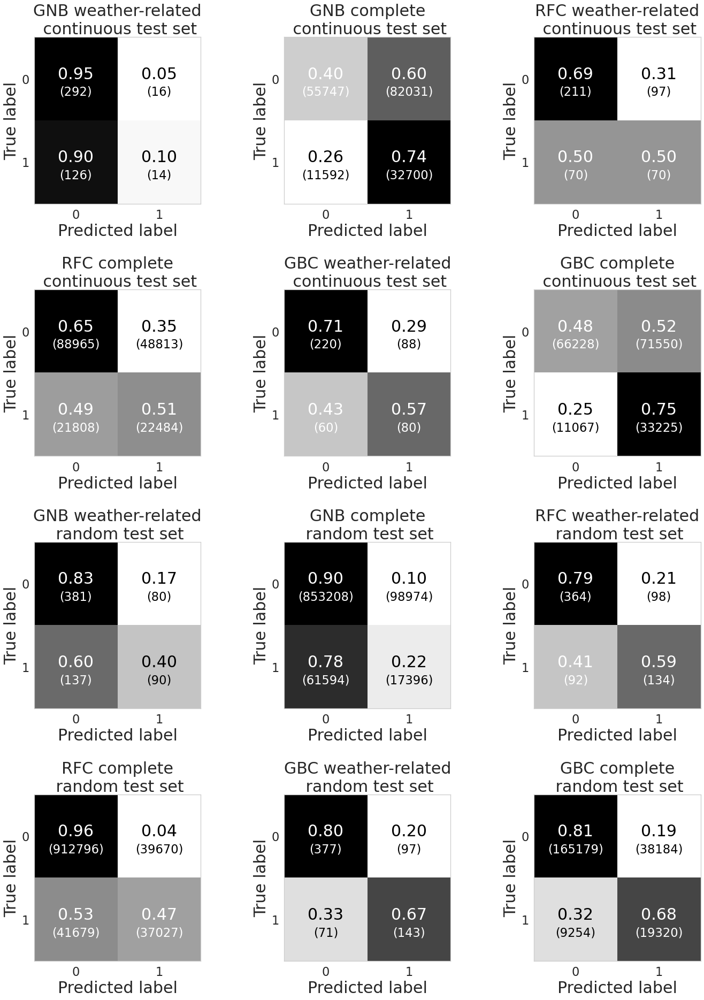

In [22]:
plot_confusions(preds)

In [150]:
plot_confusions(preds_weather, dpi=600)

In [151]:
plot_confusions(preds_complete, dpi=600)

## Accuracies

In [377]:
for p in preds:
    y, y_pred_proba = p['pred']
    y_pred = np.argmax(y_pred_proba, axis=1)
    print('{}: {:.2f}'.format(p['label'], accuracy_score(y, y_pred)))
    
print('Validation set:')
for p in preds:
    values, _ = p['pred_val']
    y, y_pred_proba = values
    y_pred = np.argmax(y_pred_proba, axis=1)
    print('{}: {:.2f}'.format(p['label'], accuracy_score(y, y_pred)))


GNB weather-related: 0.72
GNB complete: 0.52
GP weather-related: 0.62
GP complete: 0.63
RFC weather-related: 0.76
RFC complete: 0.46
Validation set:
GNB weather-related: 0.68
GNB complete: 0.89
GP weather-related: 0.62
GP complete: 0.90
RFC weather-related: 0.74
RFC complete: 0.82


# Kernel effect

In [64]:
x = np.linspace(0,10).reshape(-1, 1)

In [60]:
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, DotProduct, PairwiseKernel

In [80]:
k1 = PairwiseKernel(metric='laplacian')
k2 = DotProduct()
kernel = PairwiseKernel(metric='laplacian') *  DotProduct() + WhiteKernel(noise_level=5)

In [81]:
y1 = k1(x, x)
y2 = k2(x, x)
y3 = kernel(x, x)

In [70]:
print(y)

[[1.00000000e+00 8.15395806e-01 6.64870320e-01 ... 6.82838870e-05
  5.56783950e-05 4.53999298e-05]
 [8.15395806e-01 1.00000000e+00 8.15395806e-01 ... 8.37432404e-05
  6.82838870e-05 5.56783950e-05]
 [6.64870320e-01 8.15395806e-01 1.00000000e+00 ... 1.02702565e-04
  8.37432404e-05 6.82838870e-05]
 ...
 [6.82838870e-05 8.37432404e-05 1.02702565e-04 ... 1.00000000e+00
  8.15395806e-01 6.64870320e-01]
 [5.56783950e-05 6.82838870e-05 8.37432404e-05 ... 8.15395806e-01
  1.00000000e+00 8.15395806e-01]
 [4.53999298e-05 5.56783950e-05 6.82838870e-05 ... 6.64870320e-01
  8.15395806e-01 1.00000000e+00]]


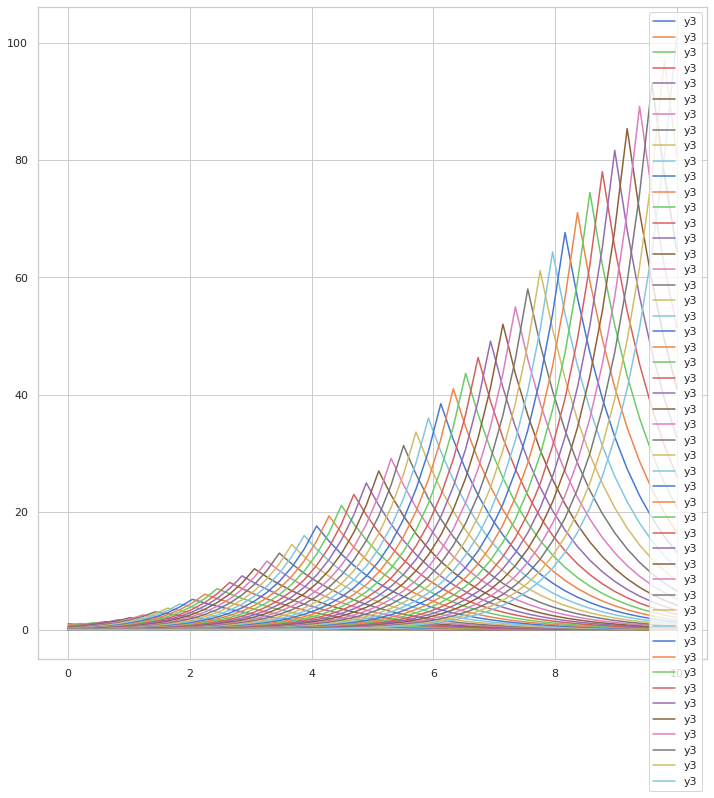

In [84]:
fig, ax = plt.subplots(figsize=(12,12))
#plt.plot(x, y1[0,:], label='y1')
#plt.plot(x, y2[0,:], label='y2')
plt.plot(x, y3, label='y3')
plt.legend()

# Get class sizes

In [235]:
def get_class_sizes(stype='weather'):
    """
    Get class sizes
    """    
    class Options():
        pass
    options = Options() 
    options.starttime = '2009-12-01'
    options.endtime = '2015-01-10'
    options.config_filename = 'cnf/dual.ini'
    options.config_name = 'bayes-rfr-weather-codes-all'
    options.stations = None

    config.read(options)
    
    starttime, endtime = io.get_dates(options)

    if stype == 'weather':
        reason_codes_exclude = None
        reason_codes_include = ['I2']
    else:
        reason_codes_exclude = 'T1,T2,P2,R1,R2,R3,R4,V4,K6,H1,H2,H3,M5,M4,S3'.split(',')
        reason_codes_include = None
    
    # Get params
    all_param_names = options.label_params + options.meta_params
    
    aggs = io.get_aggs_from_param_names(options.feature_params)
    
    all_data = bq.get_rows(starttime,
                           endtime,
                           loc_col='trainstation',
                           project=options.project,
                           dataset='trains_data',
                           table='features',
                           parameters=all_param_names,
                           locations=options.stations,
                           reason_code_table='reason_codes',
                           reason_codes_exclude=reason_codes_exclude,
                           reason_codes_include=reason_codes_include
                          )
    all_data = io.filter_train_type(labels_df=all_data,
                                    train_types=['K','L'],
                                    sum_types=True,
                                    train_type_column='train_type',
                                    location_column='trainstation',
                                    time_column='time',
                                    sum_columns=['delay'],
                                    aggs=aggs)
   
    all_data['class'] = all_data['delay'].map(lambda x: 1 if x > 40 else 0)
    
    log_class_dist(all_data['class'], [0, 1])

In [234]:
get_class_sizes()

 0: 6173 (79.58)%
 1: 1584 (20.42)%


In [236]:
get_class_sizes('all')

/opt/conda/lib/python3.8/site-packages/google/cloud/bigquery/client.py:410: UserWarning: Cannot create BigQuery Storage client, the dependency google-cloud-bigquery-storage is not installed.
  warnings.warn(


 0: 10590076 (97.87)%
 1: 230152 (2.13)%


# Feature importance

In [126]:
fname = 'models/rf/trains_data/all-codes/model.pkl'
model = io.load_scikit_model(fname)

In [127]:
rfr_weather = io.load_scikit_model('models/rf/trains_data/weather-codes/model.pkl')

In [128]:
class Options():
    pass
options_rfr = Options() 
options_rfr.config_filename = 'cnf/rf.ini'
options_rfr.config_name = 'all-codes'

config.read(options_rfr)

In [271]:
def rfc_feature_importance(data, feature_names = None, fontsize=20):
    fig, ax = plt.subplots(figsize=(20,8))

    plt.clf()
    plt.rc('font', size=fontsize)
    
    plt.tick_params(axis = 'x', which = 'both', labelsize = 3/4*fontsize)
    plt.tick_params(axis = 'y', which = 'major', labelsize = 3/4*fontsize)
    
    if feature_names is None:
        feature_names = range(0,len(data))
    else:
        plt.xticks(rotation=45, ha='right')
        fig.subplots_adjust(bottom=0.3)

    plt.bar(feature_names, data, align='center', color='gray')
    
    plt.xlabel('Components', fontsize=fontsize)
    plt.ylabel('Importance', fontsize=fontsize)

In [129]:
names = ['Latitude', 'Longitude', 'Min pressure', 'Min temperature', 
         'Max temperature', 'Mean temperature', 'Mean dewpoint', 
         'Mean humidity', 'Mean wind direction', 'Mean wind speed', 
         'Max wind gust', 
         'Max snowdepth',
         'Max cloud cover', 
         'Min cloud base',          
         'Max precipitation 3h', 
         'Max precipitation 6h', 
         'Min visibility', 'Month']
#rfc_feature_importance(model.feature_importances_, names, fontsize=25)
#rfc_feature_importance(model.feature_importances_, options.feature_params+['month'])

In [142]:
def rfc_feature_importance2(data, feature_names = None, fontsize=20, dpi=70, color='gray', xaxis=' (%)'):
    plt.clf()
    fig, ax = plt.subplots(figsize=(10,20), dpi=dpi)

    plt.rc('font', size=fontsize)
    
    plt.tick_params(axis = 'x', which = 'both', labelsize = 3/4*fontsize)
    plt.tick_params(axis = 'y', which = 'major', labelsize = 3/4*fontsize)
    
    if feature_names is None:
        feature_names = range(0,len(data))
    else:
        fig.subplots_adjust(bottom=0.3)

    plt.barh(feature_names, data, align='center', color=color)
    
    plt.ylabel('Components', fontsize=fontsize)
    plt.xlabel(f'Importance{xaxis}', fontsize=fontsize)  
    
    plt.gca().yaxis.grid(False)
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)    

In [ ]:
colors = ['xkcd:olive green', 'xkcd:light blue', 'xkcd:mustard', 'xkcd:blood', 'xkcd:coral', 'xkcd:very dark purple']

In [143]:
df = pd.DataFrame(model.feature_importances_, columns=['Importance'])
df['Parameter'] = names
df.sort_values(by=['Importance'], inplace=True, ascending=True)
rfc_feature_importance2(df['Importance'], df['Parameter'], fontsize=35, dpi=600, color='xkcd:light blue')

<Figure size 432x288 with 0 Axes>

In [144]:
df = pd.DataFrame(rfr_weather.feature_importances_, columns=['Importance'])
df['Parameter'] = names
df.sort_values(by=['Importance'], inplace=True, ascending=True)
rfc_feature_importance2(df['Importance'], df['Parameter'], fontsize=35, dpi=600, color='xkcd:blood')

<Figure size 432x288 with 0 Axes>

### Permutation feature importance

In [94]:
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestRegressor

In [108]:
def get_data(options): 
    starttime, endtime = io.get_dates(options)
    print('Loading data for {} - {} ...'.format(starttime, endtime))
    
    # Get params
    all_param_names = options.label_params + options.feature_params + options.meta_params
    aggs = io.get_aggs_from_param_names(options.feature_params)
    
    data = bq.get_rows(starttime,
                       endtime,
                       loc_col='trainstation',
                       project=options.project,
                       dataset='trains_data',
                       table='features_wo_testset_v4',
                       parameters=all_param_names,
                       locations=options.stations,
                       reason_code_table='reason_codes',
                       reason_codes_exclude=options.reason_codes_exclude,
                       reason_codes_include=options.reason_codes_include
                      )
    print('Filtering data...')
    data = io.filter_train_type(labels_df=data,
                                train_types=['K','L'],
                                sum_types=True,
                                train_type_column='train_type',
                                location_column='trainstation',
                                time_column='time',
                                sum_columns=['delay'],
                                aggs=aggs)

    data.sort_values(by=['time', 'trainstation'], inplace=True)
    #data.set_index('time', inplace=True)

    data = io.calc_delay_avg(data)
    data = data.assign(month=lambda df: df.loc[:, 'time'].map(lambda x: x.month))
    
    print('Train data contain {} rows...'.format(len(data)))

    # Get test data
    s = dt.datetime.strptime('2011-02-01', "%Y-%m-%d")
    e = dt.datetime.strptime('2011-03-01', "%Y-%m-%d")
    test_data = bq.get_rows(s,
                            e,
                            loc_col='trainstation',
                            project=options.project,
                            dataset=options.feature_dataset,
                            table=options.test_table,
                            locations=options.locations,
                            parameters=all_param_names,
                            reason_code_table=options.reason_code_table,
                            reason_codes_exclude=options.reason_codes_exclude,
                            reason_codes_include=options.reason_codes_include
                            )

    test_data = io.filter_train_type(labels_df=test_data,
                                     train_types=['K','L'],
                                     sum_types=True,
                                     train_type_column='train_type',
                                     location_column='trainstation',
                                     time_column='time',
                                     sum_columns=['delay'],
                                     aggs=aggs)

    test_data.set_index('time', inplace=True)
    
    test_data = io.calc_delay_avg(test_data)
    test_data = test_data.assign(month=lambda df: df.index.map(lambda x: x.month))
    test_data['month'] = test_data.index.map(lambda x: x.month)
    
    return data, test_data

In [105]:
class Options():
    pass
options_rfr_weather = Options() 
options_rfr_weather.starttime = '2010-01-01'
options_rfr_weather.endtime = '2015-01-01'
options_rfr_weather.config_filename = 'cnf/rf.ini'
options_rfr_weather.config_name = 'weather-codes'
options_rfr_weather.stations = None 
           
config.read(options_rfr_weather)

In [109]:
data_train, data_test = get_data(options_rfr_weather)

Loading data for 2010-01-01 00:00:00 - 2015-01-01 00:00:00 ...
Filtering data...
Train data contain 6879 rows...


In [110]:
data_train.head(2)

,delay,lat,lon,pressure,max_temperature,min_temperature,mean_temperature,mean_dewpoint,mean_humidity,mean_winddirection,...,min_vis,min_clhb,max_precipitation3h,max_precipitation6h,trainstation,time,train_type,train_count,count,month
807,8.0,60.404297,25.106028,1004.8,-6.8,-14.8,-11.2,-12.6,88.8,42.8,...,4680.0,0.0,0.6,1.6,KE,2010-01-01 05:00:00+00:00,L,1,1,1
808,8.0,60.404297,25.106028,1004.8,-6.8,-14.8,-11.2,-12.6,88.8,42.8,...,4680.0,0.0,0.6,1.6,KE,2010-01-01 05:00:00+00:00,L,1,1,1


In [111]:
X_train = data_train.loc[:,options_rfr_weather.feature_params+['month']].astype(np.float32).values
y_train = data_train.loc[:, 'delay'].astype(np.float32).values.ravel()
X_test = data_test.loc[:,options_rfr_weather.feature_params+['month']].astype(np.float32).values
y_test = data_test.loc[:, 'delay'].astype(np.float32).values.ravel()

In [124]:
result = permutation_importance(rfr_weather, X_train, y_train, scoring='neg_root_mean_squared_error', n_repeats=50)

In [145]:
df = pd.DataFrame(result.importances_mean, columns=['Importance'])
df['Parameter'] = names
df.sort_values(by=['Importance'], inplace=True, ascending=True)
rfc_feature_importance2(df['Importance'], df['Parameter'], fontsize=35, dpi=600, color='xkcd:very dark purple', xaxis=' (RMSE)')

<Figure size 432x288 with 0 Axes>

# Regression continuous testset

In [45]:
def plot_delay(results,
               header='True and predicted delay (February 2011)',
               fs = 30,
               dpi= 70
               ):
    """
    Plot delay and predicted delay over time
    """
    plt.clf()
    plt.rcParams.update({'font.size': fs})

    fig, ax = plt.subplots(figsize=(20,6.5), dpi=dpi)
    max_ = 0
    lns = []
    markers = ['x','o']
    linestyles = ['--', '-.', '-', ':']
    colors = ['xkcd:red','xkcd:forest green','xkcd:orange']
    
    i = 0
    first = True
    for heading, res in results.items():
        times, delay, pred_delay = res

        max_ = 0
        if first:
            lns += ax.plot(times,
                           delay,
                           c="#126cc5",
                           linewidth=0.75,
                           label="True delay")
            if max(delay) > max_:
                max_ = max(delay)
            first = False
            
        lns += ax.plot(times,
                       pred_delay,
                       c=colors[i],
                       linewidth=0.85,                       
                       linestyle=linestyles[i],
                       label=f"Predicted delay ({heading})")
        if max(pred_delay) > max_:
            max_ = max(pred_delay)
        i+=1

    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
    ax.xaxis.set_tick_params(rotation=45)
    ax.xaxis.set_visible(True)
    
    ax.set_ylabel("Delay [minutes]", fontsize=fs)
    #ax.set_yticks(list(ax.get_yticks()+[40]))
    
    ax.grid(True)

    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, frameon=False, ncol=4, fontsize=fs, loc='upper center', bbox_to_anchor=(0.5, -.25))

    ax.set_ylim([0,max_])
    ax.tick_params(axis='both', which='major', labelsize=fs)
    ax.tick_params(axis='both', which='minor', labelsize=fs)
    
    xticks = ax.xaxis.get_major_ticks()
    xticks[-1].label1.set_visible(False)
    plt.title(header, fontsize=fs*1.2)        
    
    plt.tight_layout()        

def read_delays(fname):
    delays = pd.read_csv(fname, sep=';')
    delays = delays.loc[(delays['times'] < '2011-03-01'),:]    
    return (pd.to_datetime(delays.loc[:,'times']), delays.loc[:,'delay'], delays.loc[:, 'predicted delay'])

In [59]:
def stats(delays, all_codes=True):

    mean_delay = 6.011229358531166 if all_codes else 12.230969312475205
    
    for heading, res in delays.items():
        times, delay, pred_delay = res
        nsamples=len(delay)
        print(f'{heading} ({nsamples}):\n')
        
        rmse = math.sqrt(metrics.mean_squared_error(delay, pred_delay))
        mae = metrics.mean_absolute_error(delay, pred_delay)
        r2 = metrics.r2_score(delay, pred_delay)
        rmse_stat = math.sqrt(metrics.mean_squared_error(delay, np.full_like(delay, mean_delay)))
        skill = 1 - rmse / rmse_stat
        
        print(f'RMSE: {rmse:.2f}')
        print(f'MAE: {mae:.2f}')
        print(f'R2: {r2:.2f}')
        print(f'SKILL: {skill:.2f}')              
        print('-----------------------\n')

In [47]:
lr_delays = read_delays('gs://trains-data/results/lr/trains_data/all-codes/validation_testset/avg_delays_all_stations.csv')
rfr_delays = read_delays('gs://trains-data/results/rf/trains_data/all-codes/validation_testset/avg_delays_all_stations.csv')
gbr_delays = read_delays('gs://trains-data/results/gbdt/trains_data/all-codes/validation_testset/avg_delays_all_stations.csv')

delays = {
    'LR': lr_delays,
    'RFR': rfr_delays,
    'GBR': gbr_delays
}

<Figure size 432x288 with 0 Axes>

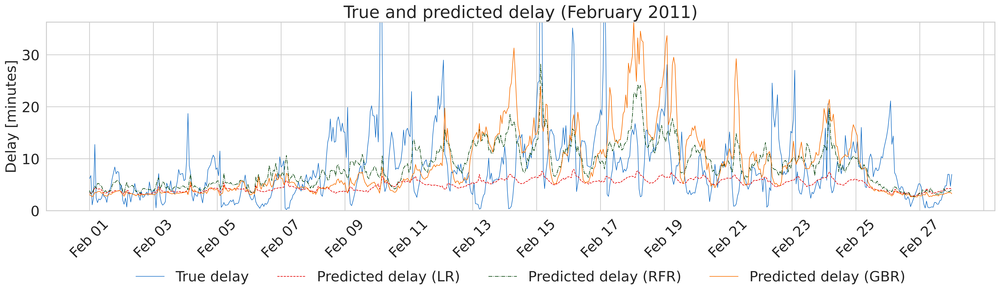

In [127]:
plot_delay(delays, fs=20, dpi=600)

In [60]:
stats(delays)

LR (645):

RMSE: 7.29
MAE: 4.68
R2: -0.18
SKILL: -0.03
-----------------------

RFR (645):

RMSE: 6.64
MAE: 4.63
R2: 0.02
SKILL: 0.06
-----------------------

GBR (645):

RMSE: 8.23
MAE: 5.57
R2: -0.50
SKILL: -0.16
-----------------------



In [57]:
lr_delays_weather = read_delays('gs://trains-data/results/lr/trains_data/weather-codes/validation_testset/avg_delays_all_stations.csv')
rfr_delays_weather = read_delays('gs://trains-data/results/rf/trains_data/weather-codes/validation_testset/avg_delays_all_stations.csv')
gbr_delays_weather = read_delays('gs://trains-data/results/gbdt/trains_data/weather-codes/validation_testset/avg_delays_all_stations.csv')

delays_weather = {
    'LR': lr_delays_weather,
    'RFR': rfr_delays_weather,
    'GBR': gbr_delays_weather
}

In [61]:
stats(delays_weather, False)

LR (143):

RMSE: 12.24
MAE: 8.66
R2: 0.18
SKILL: 0.10
-----------------------

RFR (143):

RMSE: 12.71
MAE: 9.59
R2: 0.12
SKILL: 0.06
-----------------------

GBR (143):

RMSE: 12.84
MAE: 8.92
R2: 0.10
SKILL: 0.05
-----------------------



In [66]:
def scatter(fname):
    delays = pd.read_csv(fname, sep=';')
    delays = delays.loc[(delays['times'] < '2011-03-01'),:] 
    delays.plot.scatter(x='delay', y='predicted delay', c='xkcd:purple')

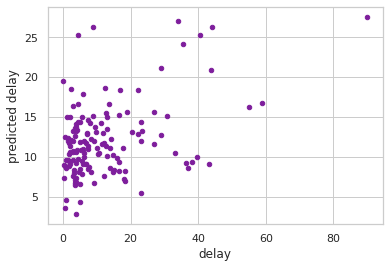

In [67]:
scatter('gs://trains-data/results/lr/trains_data/weather-codes/validation_testset/avg_delays_all_stations.csv')

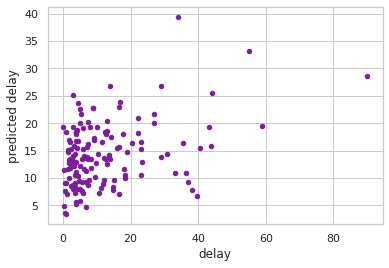

In [68]:
scatter('gs://trains-data/results/rf/trains_data/weather-codes/validation_testset/avg_delays_all_stations.csv')

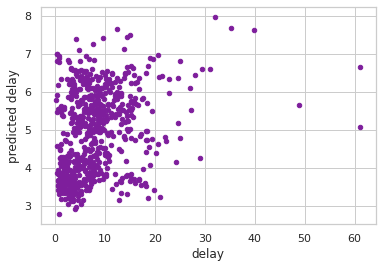

In [69]:
scatter('gs://trains-data/results/lr/trains_data/all-codes/validation_testset/avg_delays_all_stations.csv')

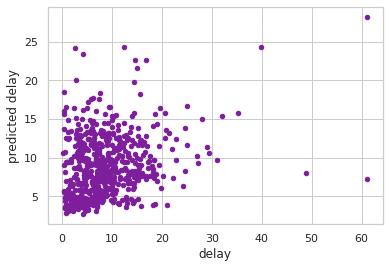

In [70]:
scatter('gs://trains-data/results/rf/trains_data/all-codes/validation_testset/avg_delays_all_stations.csv')

In [ ]:
delay_data = 'gs://trains-data/results/gbdt/trains_data/all-codes/validation_testset/avg_delays_all_stations.csv'

In [24]:
delays = pd.read_csv(delay_data, sep=';')

In [26]:
delays

,times,delay,predicted delay
0,2011-02-01T00:00:00,6.186589,3.092239
1,2011-02-01T01:00:00,6.758706,2.918475
2,2011-02-01T02:00:00,1.134328,2.687046
3,2011-02-01T03:00:00,2.484848,2.951534
4,2011-02-01T04:00:00,12.741935,3.524301
...,...,...,...
1289,2014-02-27T20:00:00,0.614451,2.143987
1290,2014-02-27T21:00:00,0.741685,2.121331
1291,2014-02-27T22:00:00,0.610724,2.079898
1292,2014-02-27T23:00:00,0.461077,2.078485


In [80]:
delays = pd.read_csv('gs://trains-data/results/rf/trains_data/all-codes/validation_testset/avg_delays_all_stations.csv',
                     sep=';')
delays

,times,delay,predicted delay
0,2011-02-01T00:00:00,6.186589,3.879033
1,2011-02-01T01:00:00,6.758706,3.154678
2,2011-02-01T02:00:00,1.134328,3.370959
3,2011-02-01T03:00:00,2.484848,4.036866
4,2011-02-01T04:00:00,12.741935,4.703755
...,...,...,...
1289,2014-02-27T20:00:00,0.614451,1.666187
1290,2014-02-27T21:00:00,0.741685,1.720908
1291,2014-02-27T22:00:00,0.610724,1.692571
1292,2014-02-27T23:00:00,0.461077,1.560148
